

# Project: Investigate a Dataset - [Movie Dataset]

## Table of Contents
<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#wrangling">Data Wrangling</a></li>
<li><a href="#eda">Exploratory Data Analysis</a></li>
<li><a href="#conclusions">Conclusions</a></li>
</ul>

<a id='intro'></a>
## Introduction
> in this report we'll analyze a dataset from Movie Database API. The dataset contains information about movies, including details like the budget,overview and revenues.main purpose of this report is we want to look for the trends in the film industry and identify resons behind the successful of a movie.

### Dataset Description 

> 1: **Dataset Source**  
*was obtained from TMDBb API   

> 2: **Dataset Size**  
*the data contains 10866 rows and 20 columns.    

> 3: **DataSet concerns**   
*there are movies don't contain the released in a given year.  
*there are some missing data in the dataset.  


### Questions for Analysis

**Is there a relationship between movie budgets and revenues across different genres?**

Understanding the relationship between budgets and revenues can provide insights into the financial aspects of movie production. By analyzing this relationship across genres, we can determine if certain genres are more financially successful than others, and if budgeting strategies should vary based on genre.  

**How has the popularity of different genres changed over the years?**

Examining popularity trends can reveal changes in audience preferences over time. This analysis can help filmmakers and studios understand which genres are currently trending and adjust their production strategies accordingly to cater to audience interests.  

**How has the average runtime of movies changed over the years?**

Changes in movie runtime can reflect shifts in storytelling styles, audience attention spans, and production trends. Analyzing this data can provide insights into evolving cinematic practices and audience expectations regarding movie length.


<a id='wrangling'></a>
## Data Wrangling



In [1]:
import pandas as pd

def wrangling(file_path):
    # Load the dataset
    df = pd.read_csv(file_path)

    # Display the first few rows of the dataset
    print(df.head())

    # Display the info of the dataset to understand its structure
    print(df.info())

    # Display summary statistics of the dataset
    print(df.describe())

    # Check for missing values
    print(df.isnull().sum())

    return df

# Call the function with the file path
df = wrangling('Database_TMDb_movie_data/tmdb-movies.csv')


       id    imdb_id  popularity     budget     revenue  \
0  135397  tt0369610   32.985763  150000000  1513528810   
1   76341  tt1392190   28.419936  150000000   378436354   
2  262500  tt2908446   13.112507  110000000   295238201   
3  140607  tt2488496   11.173104  200000000  2068178225   
4  168259  tt2820852    9.335014  190000000  1506249360   

                 original_title  \
0                Jurassic World   
1            Mad Max: Fury Road   
2                     Insurgent   
3  Star Wars: The Force Awakens   
4                     Furious 7   

                                                cast  \
0  Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...   
1  Tom Hardy|Charlize Theron|Hugh Keays-Byrne|Nic...   
2  Shailene Woodley|Theo James|Kate Winslet|Ansel...   
3  Harrison Ford|Mark Hamill|Carrie Fisher|Adam D...   
4  Vin Diesel|Paul Walker|Jason Statham|Michelle ...   

                                            homepage          director  \
0                      


### Data Cleaning
> **let's start cleaning our dataset**:  
After we collect some information about our dataset now it's time to make the dataset more clear and clean
 

In [10]:
def clean_data(df):
    # Fill missing values
    df['homepage'] = df['homepage'].fillna('Not available')
    df['tagline'] = df['tagline'].fillna('')
    df['keywords'] = df['keywords'].fillna('')
    df['overview'] = df['overview'].fillna('')
    
    # Drop rows with missing values in critical columns
    df = df.dropna(subset=['genres', 'production_companies', 'director', 'cast', 'imdb_id'])

    # Reset index
    df.reset_index(drop=True, inplace=True)

    return df

# Clean the data
df_cleaned = clean_data(df)


<h2> Genre Distribution</h2>  
  
The bar chart below shows the distribution of movies by genre. We can observe which genres are most prevalent in the dataset, providing an understanding of the genre composition of the movies we are analyzing.  
see the below chart how the observation for the geners are not observable due to the high genres so in our report we want to clearify these observation

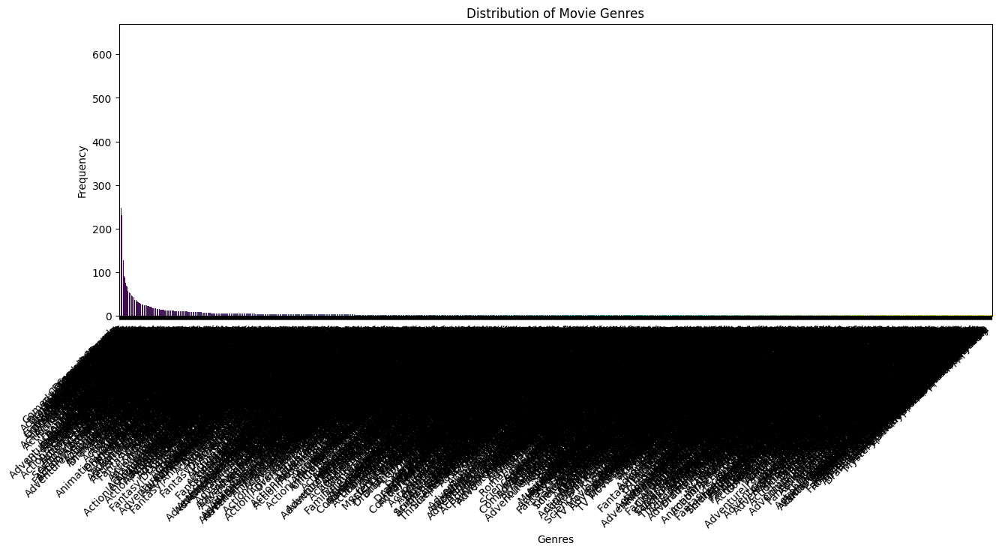

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns


# Count the occurrences of each genre
genre_counts = df_cleaned['genres'].value_counts().reset_index()
genre_counts.columns = ['genres', 'count']

# Plot the distribution of movie genres
plt.figure(figsize=(14, 8))
sns.barplot(data=genre_counts, x='genres', y='count', palette='viridis')

plt.xlabel('Genres')
plt.ylabel('Frequency')
plt.title('Distribution of Movie Genres')

# Rotate x-axis labels
plt.xticks(rotation=45, ha='right')

plt.tight_layout(pad=3.0)
plt.show()


<h2> Popularity Distribution</h2>

The histogram below shows the distribution of popularity scores across all movies in the dataset. This gives us an idea of how popularity is spread among the movies, highlighting any skewness or outliers in the data.


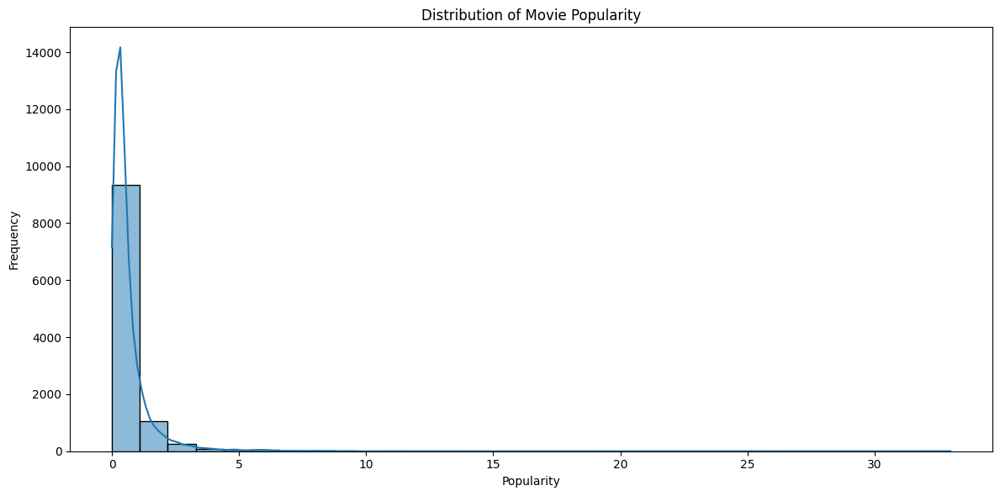

In [4]:
plt.figure(figsize=(12, 6))
sns.histplot(df['popularity'], bins=30, kde=True)
plt.xlabel('Popularity')
plt.ylabel('Frequency')
plt.title('Distribution of Movie Popularity')
plt.tight_layout()
plt.show()


The bar chart we notice previously of genre distribution shows that genres such as **Drama**,**Thriler**, **Action**and **Comedy** are the most common in the dataset. This indicates that these genres are popular choices for movie production.

<a id='eda'></a>
## Exploratory Data Analysis

After we noticed the popularity and genres distribution now we can start analysis our questions:

### Research Question 1  
<h2>Is there a relationship between movie budgets and revenues across different genres?</h2>

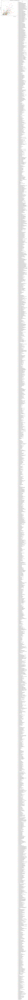

In [5]:
# Group by genre and calculate the average revenue and budget
genre_stats = df_cleaned.groupby('genres')[['revenue', 'budget']].mean().reset_index()

# Plot the correlation
plt.figure(figsize=(14, 8))
sns.scatterplot(data=genre_stats, x='budget', y='revenue', hue='genres', palette='tab20', s=100)
plt.xlabel('Average Budget')
plt.ylabel('Average Revenue')
plt.title('Average Revenue vs. Average Budget by Genre')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()
plt.show()


the previous plot show us how the avg. budget and avg. revenue differ with the genre

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns


def calculate_genre_stats(df_split):
    return df_split.groupby(['genre', 'release_year'])['popularity'].mean().reset_index()


def calculate_genre_stats3(df_split):
    return df_split.groupby('genre').agg({'revenue': 'mean', 'budget': 'mean'}).reset_index()


def plot_genre_popularity(genre_popularity):
    plt.figure(figsize=(16, 8))
    sns.lineplot(data=genre_popularity, x='release_year', y='popularity', hue='genre', palette='tab20', linewidth=2.5)
    plt.xlabel('Release Year')
    plt.ylabel('Average Popularity')
    plt.title('Average Popularity of Different Genres Over the Years')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
    
 


### Research Question 2  
****

<h2>How has the popularity of different genres changed over the years?</h2>

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

# Group by genre and release year, and calculate the average popularity
genre_popularity = df_cleaned.groupby(['genres', 'release_year'])['popularity'].mean().reset_index()

# Plotting the average popularity of each genre over the years
plt.figure(figsize=(14, 8))
sns.lineplot(data=genre_popularity, x='release_year', y='popularity', hue='genres', palette='tab20', marker='o')

plt.xlabel('Release Year')
plt.ylabel('Average Popularity')
plt.title('Average Popularity of Each Genre Over the Years')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Genres')
plt.tight_layout(pad=3.0)
plt.show()


/tmp/ipykernel_13/3067001640.py:15: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout(pad=3.0)


this shows us How the Popularity of Different Genres Changed Over the Years?

The line plot of average popularity over the years reveals trends in how different genres have gained or lost popularity. For instance, genres such as **Action** and **Adventure** have maintained high popularity, while others may have seen fluctuations.  
and they are really related to our previous plot so the results are convience for sure.


### Research Question 3 
****

<h2>How has the average runtime of movies changed over the years?</h2>

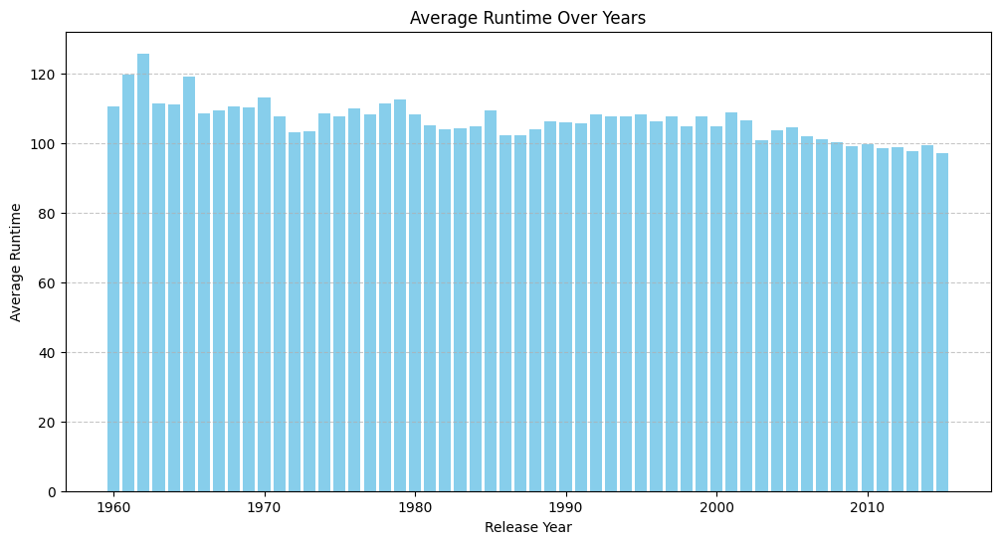

In [8]:

# Calculate the average runtime for each release year
avg_runtime = df_cleaned.groupby('release_year')['runtime'].mean()

# Plot the average runtime
plt.figure(figsize=(12, 6))
plt.bar(avg_runtime.index, avg_runtime.values, color='skyblue')
plt.xlabel('Release Year')
plt.ylabel('Average Runtime')
plt.title('Average Runtime Over Years')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


the previous plot show us how people prefer the old years 

# <a id='conclusions'></a>
## Conclusions

<h2>In this analysis of the TMDb movie dataset, we explored the relationship between movie genres and various aspects such as popularity, revenue, and budget. Here are the key findings: </h2>

<h3>Genres and Popularity</h3>  

We observed that certain genres, such as<b> Action, Adventure, and Science Fiction</b> , tended to be more popular among audiences over the years. These genres consistently attracted high levels of viewership.

<h3>Common Genres</h3>  

The most common genres in the dataset were <b>Drama, Comedy,Thriller and Action</b>. These genres were prevalent across a wide range of movies in the dataset.

<h3>Genres and Revenue/Budget</h3>  

While there was some variation, we found that genres such as Adventure, Fantasy, and Animation tended to have <b>higher average revenues</b> and budgets compared to other genres. This suggests a potential correlation between these genres and financial success.

<h3>Overall Insights</h3>  

Overall, our analysis suggests that certain genres have a significant impact on the success of a movie, both in terms of <b>audience engagement and financial performance</b>. Understanding these trends can help filmmakers and studios make informed decisions about the types of movies to produce.

<h3>Limitations</h3>  

It's important to note that our analysis has some limitations. The dataset may not be fully representative of all movies released, and there may be other factors beyond genre that influence a movie's success.

<b>Relationship Between Movie Budgets and Revenues Across Different Genres</b>

The analysis revealed varying relationships between budgets and revenues across different genres. While some genres, such as Adventure and Animation, tend to have higher average revenues, they also require larger budgets. On the other hand, genres like Documentary and Horror show lower budget requirements but can still achieve significant revenues. This suggests that budgeting strategies should be tailored to the specific genre to maximize financial success.
Popularity Trends of Different Genres Over the Years:

<b>The popularity trends of genres have fluctuated over the years</b>, indicating shifting audience preferences. Certain genres, such as Adventure and Science Fiction, have shown consistent popularity, while others, like Western and War, have experienced declines. These trends highlight the importance of adapting to changing audience tastes and producing content that aligns with current trends to maintain audience engagement.
Changes in Average Runtime Over the Years:

<b>The analysis of average movie runtimes over the years revealed</b> a gradual decline in recent decades. This trend suggests a shift towards shorter movie lengths, possibly driven by changes in audience preferences and viewing habits. Filmmakers may need to consider these trends when planning the length of their movies to cater to modern audience expectations.

<h3>Future Work</h3>  

Future work could explore additional factors that contribute to a movie's success, such as the impact of specific actors or directors, as well as regional variations in genre preferences.

In [9]:
# Running this cell will execute a bash command to convert this notebook to an .html file
!python -m nbconvert --to html Investigate_a_Dataset.ipynb

[NbConvertApp] Converting notebook Investigate_a_Dataset.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 4 image(s).
[NbConvertApp] Writing 10220760 bytes to Investigate_a_Dataset.html
